# Morfolojik görüntü işleme

Bir görüntüdeki özelliklerin şekli veya morfolojisi ile ilgili doğrusal olmayan işlemler topluluğudur. 
Bu işlemler özellikle ikili görüntülerin 
(piksellerin 0 veya 1 olarak temsil edildiği ve geleneksel olarak nesnenin ön planının = 1 veya beyaz 
 ve arka planının = 0 veya siyah olduğu) işlenmesi için uygundur, ancak gri tonlamalı görüntülere de genişletilebilir.
 
Morfolojik işlemlerde, giriş görüntüsünü incelemek için bir yapılandırma elemanı (küçük bir şablon görüntü) kullanılır. Algoritmalar, yapılandırma elemanını giriş görüntüsündeki tüm olası konumlara yerleştirerek ve bir küme operatörü ile piksellerin karşılık gelen komşuluğu ile karşılaştırarak çalışır. Bazı işlemler elemanın komşuluğa uyup uymadığını test ederken, diğerleri komşuluğa çarpıp çarpmadığını veya kesişip kesişmediğini test eder. Birkaç popüler morfolojik operatör veya filtre, ikili genişletme ve erozyon, açma ve kapama, inceltme, iskeletleştirme, morfolojik kenar dedektörleri, hit or miss filtreleri, sıralama filtreleri, medyan filtreleri ve çoğunluk(majority) filtreleridir.

Bu bölümde ele alınacak konular aşağıdaki gibidir:

    Scikit-image morfoloji modülü ile morfolojik görüntü işleme
    scikit-image filter.rank modülü ile morfolojik görüntü işleme
    scipy.ndimage.morphology modülü ile morfolojik görüntü işleme

In [2]:
#The scikit-image morphology module

#Binary operations

#Fonksiyonları çağırmadan önce ikili bir giriş görüntüsü oluşturmamız gerekir(örneğin, sabit bir eşiğe sahip basit eşikleme ile).


<Figure size 640x480 with 0 Axes>

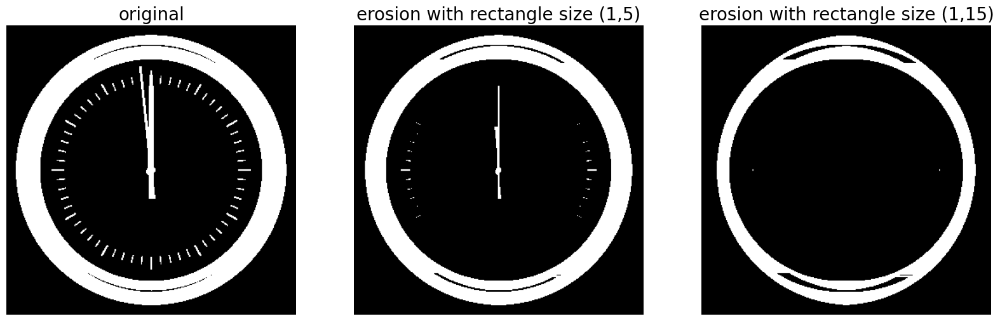

In [2]:
# Erosion

#Erozyon, ön plandaki nesnelerin boyutunu küçülten, nesne sınırlarını yumuşatan ve 
#yarımadaları, küçük nesneleri kaldıran temel bir morfolojik işlemdir. 

#ikili bir görüntünün hızlı ikili morfolojik erozyonunu hesaplayan binary_erosion() fonksiyonu:

#% matplotlib inline
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pylab as pylab
import numpy as np

from skimage.morphology import binary_erosion, rectangle

def plot_image(image, title=''):
    pylab.title(title, size=20), pylab.imshow(image)
    pylab.axis('off') # comment this line if you want axis ticks
    

im = rgb2gray(imread('Ims/clock2.jpg'))
im[im <= 0.5] = 0 # create binary image with fixed threshold 0.5
im[im > 0.5] = 1
pylab.gray()
pylab.figure(figsize=(20,10))
pylab.subplot(1,3,1), plot_image(im, 'original')
im1 = binary_erosion(im, rectangle(1,5))
pylab.subplot(1,3,2), plot_image(im1, 'erosion with rectangle size (1,5)')
im1 = binary_erosion(im, rectangle(1,15))
pylab.subplot(1,3,3), plot_image(im1, 'erosion with rectangle size (1,15)')
pylab.show()


#yapılandırma elemanı ince, küçük, dikey bir dikdörtgen olarak erozyon kullanılarak, 
#önce ikili saat görüntüsündeki küçük tikler kaldırılır. 

#Daha sonra, saat ibrelerini de aşındırmak için daha uzun bir dikey dikdörtgen kullanılır:

<Figure size 640x480 with 0 Axes>

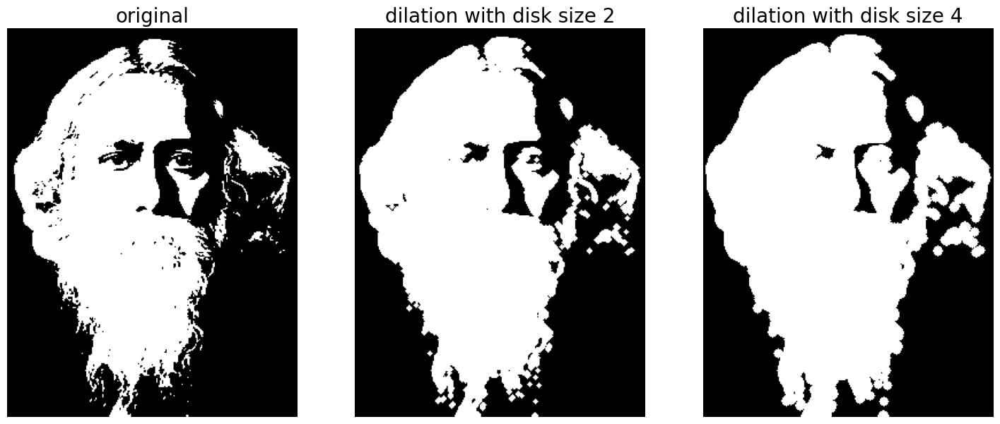

In [3]:
#Dilation

#Dilation, ön plandaki nesnelerin boyutunu genişleten, nesne sınırlarını yumuşatan ve 
#ikili bir görüntüdeki delikleri ve boşlukları kapatan bir başka temel morfolojik işlemdir. 

from skimage.morphology import binary_dilation, disk
from skimage import img_as_float
im = img_as_float(imread('Ims/tagore.png'))
im = 1 - im[...,3]
im[im <= 0.5] = 0
im[im > 0.5] = 1
pylab.gray()
pylab.figure(figsize=(18,9))
pylab.subplot(131)
pylab.imshow(im)
pylab.title('original', size=20)
pylab.axis('off')
for d in range(1,3):
    pylab.subplot(1,3,d+1)
    im1 = binary_dilation(im, disk(2*d))
    pylab.imshow(im1)
    pylab.title('dilation with disk size ' + str(2*d), size=20)
    pylab.axis('off')
pylab.show()  

#Daha küçük boyutlu bir yapılandırma elemanı ile, yüzdeki birkaç ayrıntı (arka plan veya boşluklar olarak kabul edilir)kaldırılmış 
#ve daha büyük boyutlu disk ile küçük boşlukların tümü doldurulmuştur:

<Figure size 640x480 with 0 Axes>

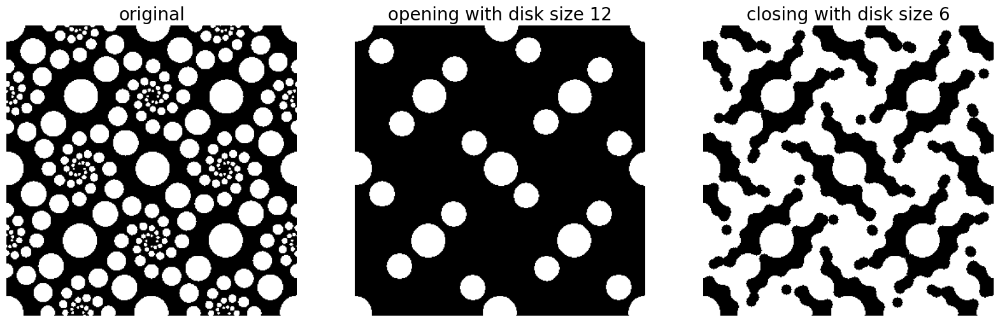

In [4]:
#Opening and closing

#Açma, önce aşındırma ve sonra genişletme işlemlerinin bir kombinasyonu olarak ifade edilebilen morfolojik bir işlemdir; ikili bir görüntüden küçük nesneleri kaldırır. 
#Kapatma ise tam tersine, önce genişletme sonra aşındırma işlemlerinin bir kombinasyonu olarak ifade edilebilen başka bir morfolojik işlemdir; ikili bir görüntüden küçük delikleri kaldırır. 
#Aşağıdaki kod parçacığı, scikit-image morfoloji modülünün ilgili fonksiyonlarının ikili bir görüntüden sırasıyla küçük nesneleri ve küçük delikleri kaldırmak için nasıl kullanılacağını göstermektedir:

from skimage.morphology import binary_opening, binary_closing, binary_erosion, binary_dilation, disk
im = rgb2gray(imread('Ims/circles.jpg'))
im[im <= 0.5] = 0
im[im > 0.5] = 1
pylab.gray()
pylab.figure(figsize=(20,10))
pylab.subplot(1,3,1), plot_image(im, 'original')
im1 = binary_opening(im, disk(12))
pylab.subplot(1,3,2), plot_image(im1, 'opening with disk size ' + str(12))
im1 = binary_closing(im, disk(6))
pylab.subplot(1,3,3), plot_image(im1, 'closing with disk size ' + str(6))
pylab.show()

#Beklendiği gibi, açma işlemi yalnızca büyük daireleri korur


<Figure size 640x480 with 0 Axes>

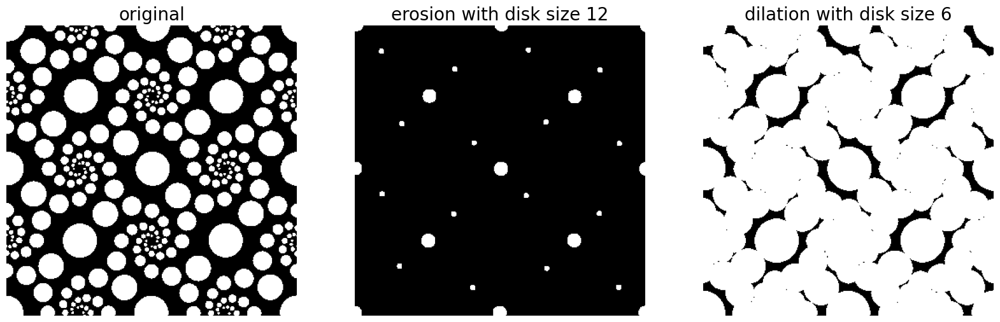

In [5]:
#Son kod bloğunda olduğu gibi aynı yapılandırma elemanı ile sırasıyla binary_opening() yerine binary_erosion() ve 
#binary_closing() yerine binary_dilation() kullanarak aşındırma ile açma ve dilation ile kapamayı karşılaştıralım.

from skimage.morphology import binary_opening, binary_closing, binary_erosion, binary_dilation, disk
im = rgb2gray(imread('Ims/circles.jpg'))
im[im <= 0.5] = 0
im[im > 0.5] = 1
pylab.gray()
pylab.figure(figsize=(20,10))
pylab.subplot(1,3,1), plot_image(im, 'original')
im1 = binary_erosion(im, disk(12))
pylab.subplot(1,3,2), plot_image(im1, 'erosion with disk size ' + str(12))
im1 = binary_dilation(im, disk(6))
pylab.subplot(1,3,3), plot_image(im1, 'dilation with disk size ' + str(6))
pylab.show()

<Figure size 640x480 with 0 Axes>

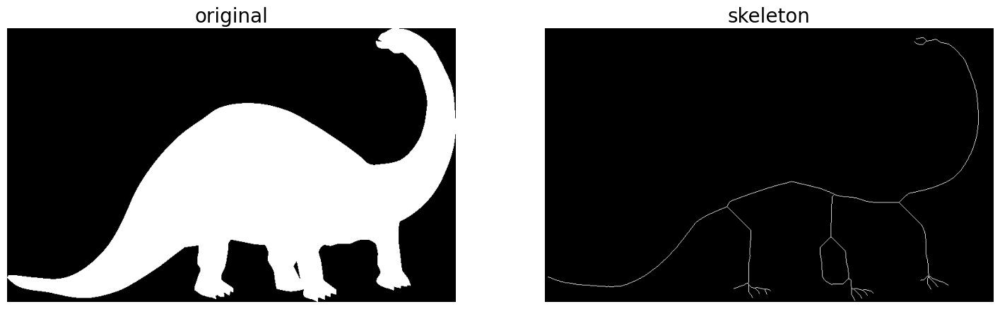

In [5]:
# Skeletonizing

#Bu işlemde, ikili bir görüntüdeki her bir bağlı bileşen, morfolojik bir inceltme işlemi kullanılarak piksel genişliğinde tek bir iskelete indirgenir.

def plot_images_horizontally(original, filtered, filter_name, sz=(18,7)):
    pylab.gray()
    pylab.figure(figsize = sz)
    pylab.subplot(1,2,1), plot_image(original, 'original')
    pylab.subplot(1,2,2), plot_image(filtered, filter_name)
    pylab.show()

from skimage.morphology import skeletonize
im = img_as_float(imread('ImageProcessingLecture/Ims/dynasaur.png')[...,3])
threshold = 0.5
im[im <= threshold] = 0
im[im > threshold] = 1
skeleton = skeletonize(im)
plot_images_horizontally(im, skeleton, 'skeleton',sz=(18,9))


<Figure size 640x480 with 0 Axes>

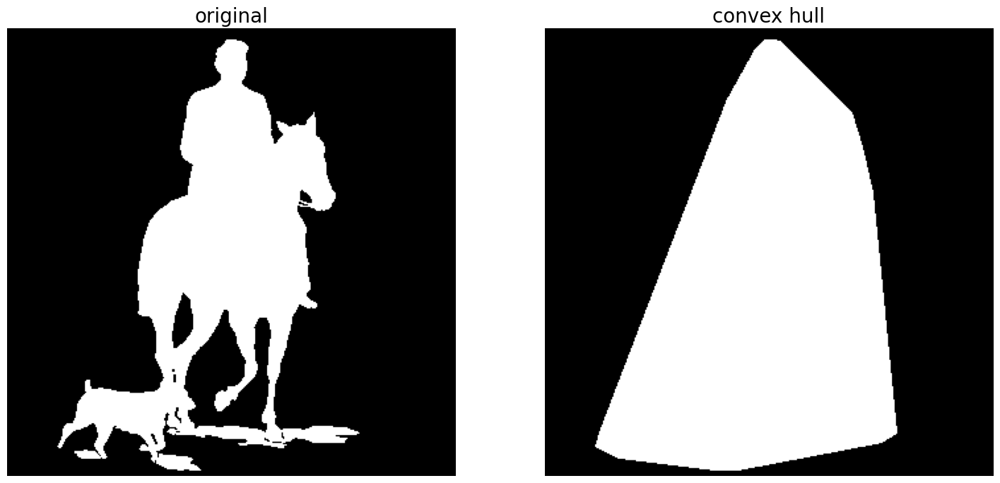

In [6]:
#Computing the convex hull
#Dışbükey gövdeyi hesaplama
#Dışbükey gövde, giriş görüntüsündeki tüm ön planı (beyaz pikseller) çevreleyen en küçük dışbükey çokgen tarafından tanımlanır.
from skimage.morphology import convex_hull_image
im = rgb2gray(imread('ImageProcessingLecture/Ims/horse-dog.jpg'))
threshold = 0.5
im[im < threshold] = 0 # convert to binary image
im[im >= threshold] = 1
chull = convex_hull_image(im)
plot_images_horizontally(im, chull, 'convex hull', sz=(18,9))

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_13688\715910696.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.bool)


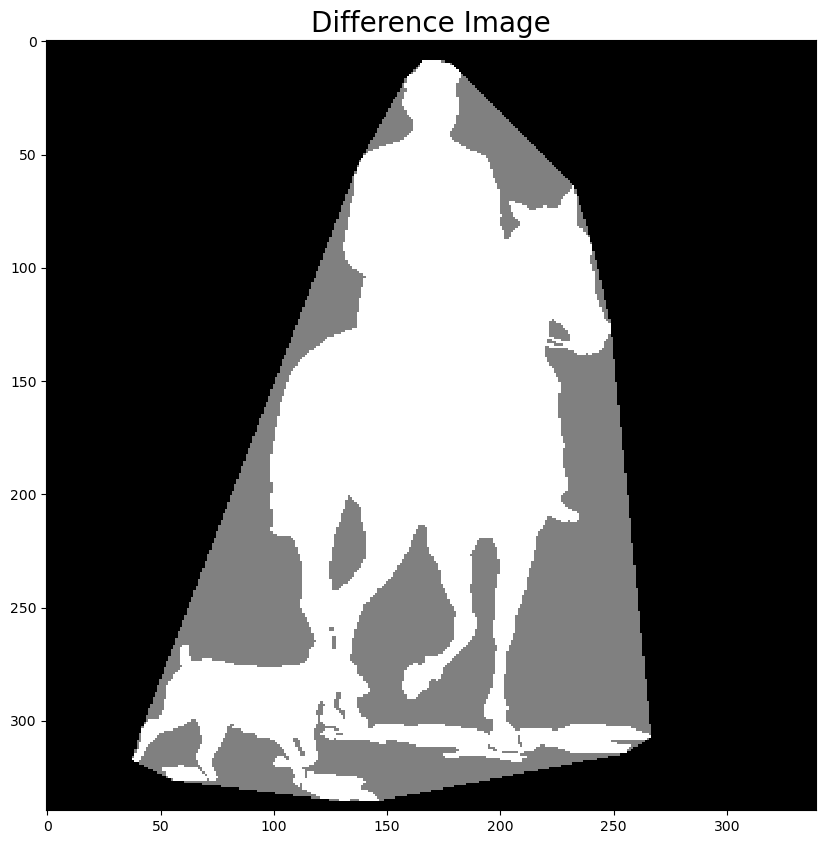

In [7]:
#Aşağıdaki kod bloğu, orijinal ikili görüntünün ve hesaplanan dışbükey gövde görüntüsünün fark görüntüsünü çizer:
im = im.astype(np.bool)
chull_diff = img_as_float(chull.copy())
chull_diff[im] = 2
pylab.figure(figsize=(20,10))
pylab.imshow(chull_diff, cmap=pylab.cm.gray, interpolation='nearest')
pylab.title('Difference Image', size=20)
pylab.show()

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_13688\702472732.py:10: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  im = im.astype(np.bool)


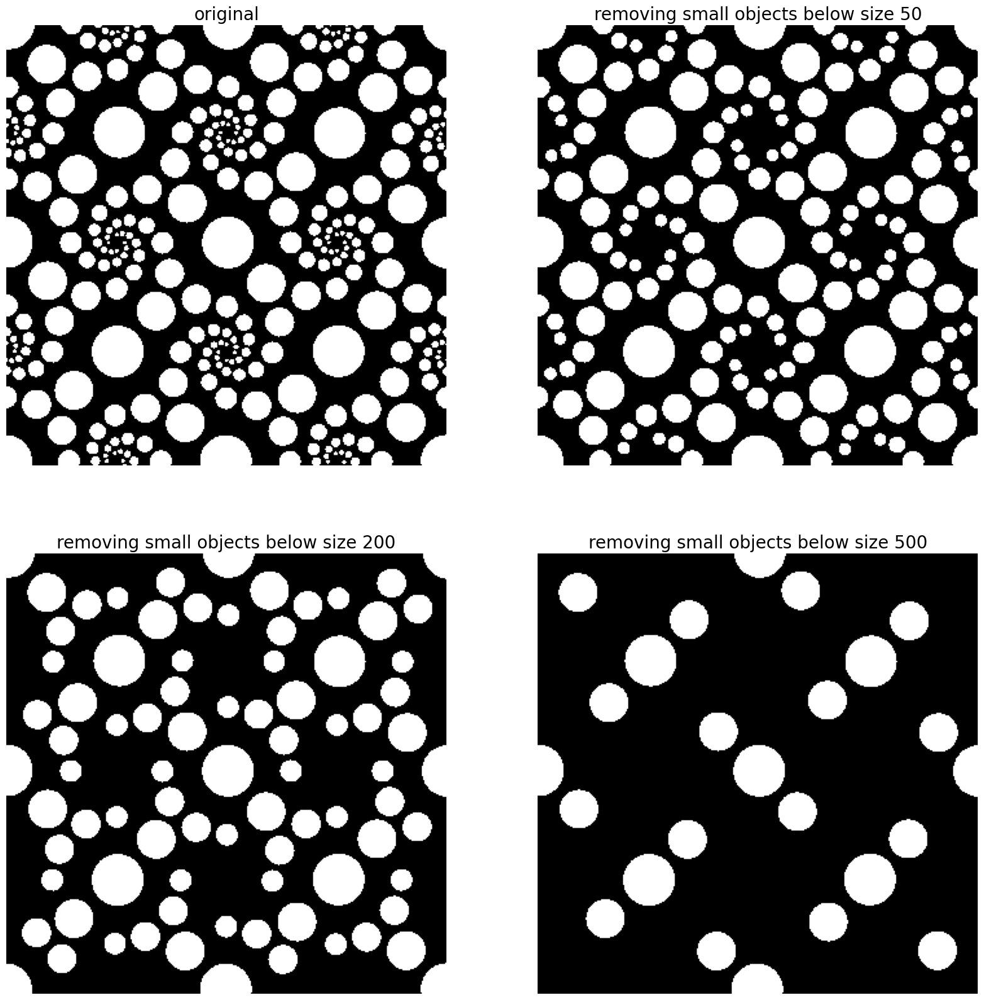

In [8]:
# Küçük nesneleri kaldırma

# Aşağıdaki kod bloğu remove_small_objects() fonksiyonunun belirtilen minimum boyut eşiğinden daha küçük nesneleri 
# kaldırmak için nasıl kullanılabileceğini göstermektedir; belirtilen eşik ne kadar yüksekse o kadar çok nesne kaldırılır:

from skimage.morphology import remove_small_objects
im = rgb2gray(imread('ImageProcessingLecture/Ims/circles.jpg'))
im[im > 0.5] = 1 # create binary image by thresholding with fixed threshold 0.5
im[im <= 0.5] = 0
im = im.astype(np.bool)
pylab.figure(figsize=(20,20))
pylab.subplot(2,2,1), plot_image(im, 'original')
i = 2
for osz in [50, 200, 500]:
    im1 = remove_small_objects(im, osz, connectivity=1)
    pylab.subplot(2,2,i), plot_image(im1, 'removing small objects below size ' + str(osz))
    i += 1
pylab.show()

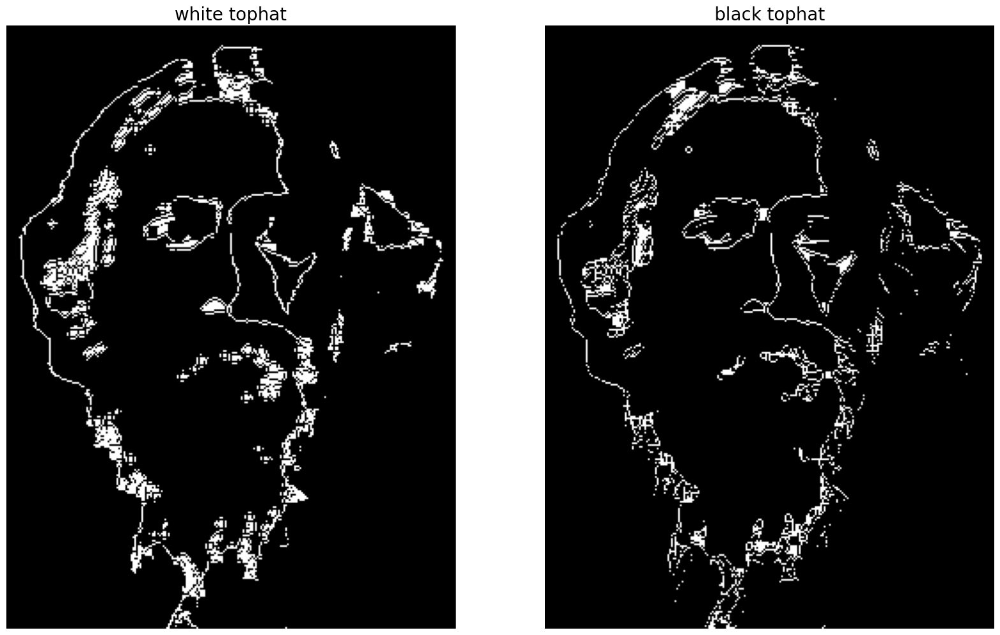

In [9]:
# White and black top-hats

#Yapılandırma elemanından daha küçük parlak noktaları hesaplar.
#Orijinal görüntü ile morfolojik açmanın fark görüntüsü olarak tanımlanır.
#Benzer şekilde, bir görüntünün siyah üst şapkası, yapılandırma elemanından daha küçük karanlık noktaları hesaplar. 
#Orijinal görüntünün morfolojik kapanış görüntüsünün fark görüntüsü olarak tanımlanır. 
#Orijinal görüntüdeki karanlık noktalar, siyah üst şapka işleminden sonra parlak noktalar haline gelir

from skimage.morphology import white_tophat, black_tophat, square
im = imread('ImageProcessingLecture/Ims/tagore.png')[...,3]
im[im <= 0.5] = 0
im[im > 0.5] = 1
im1 = white_tophat(im, square(5))
im2 = black_tophat(im, square(5))
pylab.figure(figsize=(20,15))
pylab.subplot(1,2,1), plot_image(im1, 'white tophat')
pylab.subplot(1,2,2), plot_image(im2, 'black tophat')
pylab.show()

<Figure size 640x480 with 0 Axes>

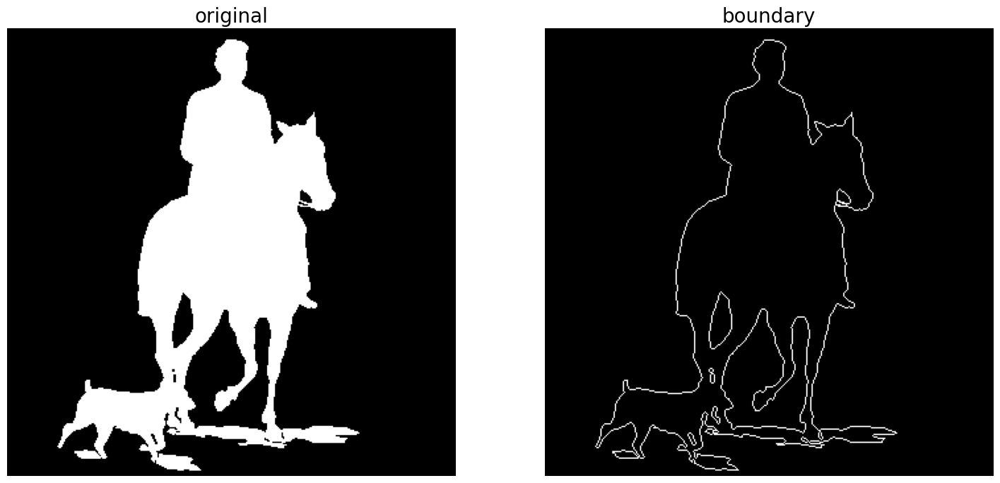

In [10]:
# Sınır çıkarma

#Aşındırma işlemi ikili bir görüntünün sınırını çıkarmak için kullanılabilir; 
#sınırı çıkarmak için aşındırılmış görüntüyü giriş ikili görüntüsünden çıkarmamız yeterlidir.

from skimage.morphology import binary_erosion
im = rgb2gray(imread('ImageProcessingLecture/Ims/horse-dog.jpg'))
threshold = 0.5
im[im < threshold] = 0
im[im >= threshold] = 1
boundary = im - binary_erosion(im)
plot_images_horizontally(im, boundary, 'boundary',sz=(18,9))

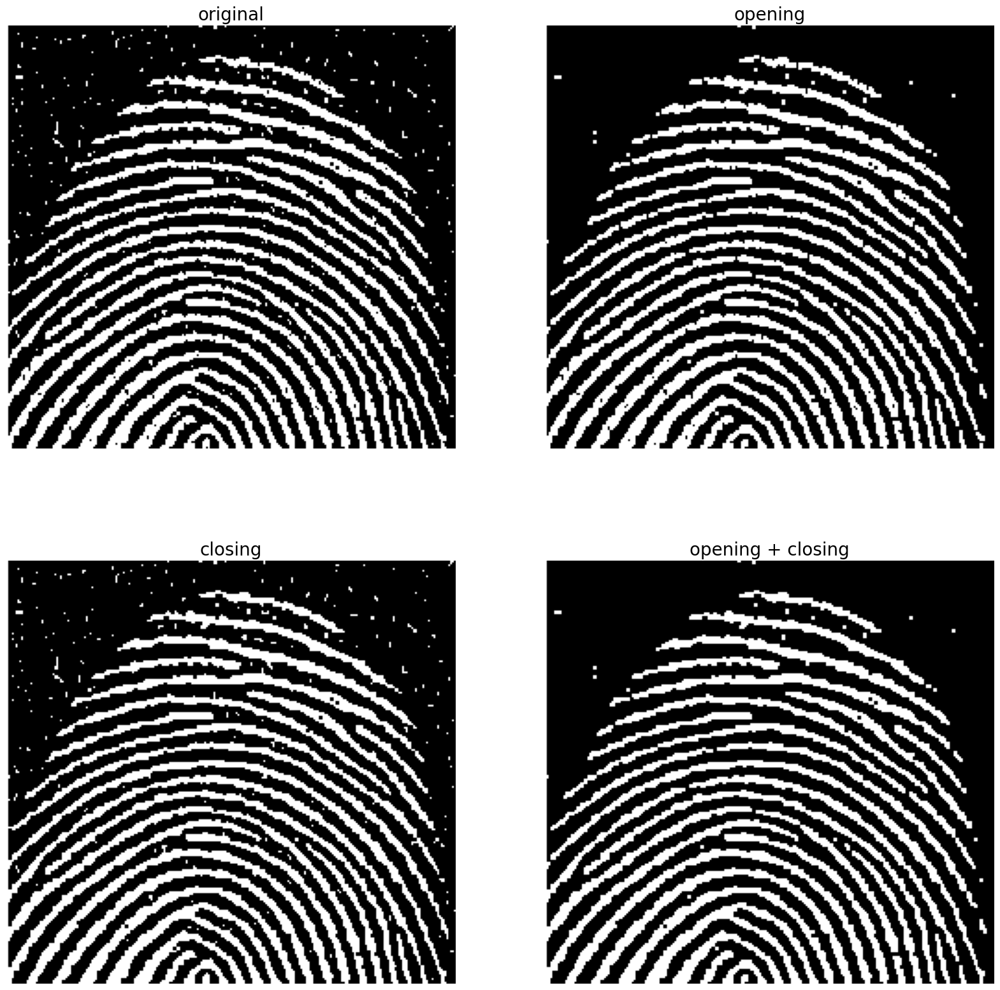

In [42]:
#Açma ve kapama ile parmak izi temizliği

#Açma ve kapama, ikili bir görüntüden gürültüyü (küçük ön plan nesneleri) gidermek için sırayla kullanılabilir. 
#Bu, bir ön işleme adımı olarak bir parmak izi görüntüsünün temizlenmesinde kullanılabilir.

im = rgb2gray(imread('ImageProcessingLecture/Ims/fingerprint.jpg'))
im[im <= 0.5] = 0 # binarize
im[im > 0.5] = 1
im_o = binary_opening(im, square(2))
im_c = binary_closing(im, square(2))
im_oc = binary_closing(binary_opening(im, square(2)), square(2))
pylab.figure(figsize=(20,20))
pylab.subplot(221), plot_image(im, 'original')
pylab.subplot(222), plot_image(im_o, 'opening')
pylab.subplot(223), plot_image(im_c, 'closing')
pylab.subplot(224), plot_image(im_oc, 'opening + closing')
pylab.show()

<Figure size 640x480 with 0 Axes>

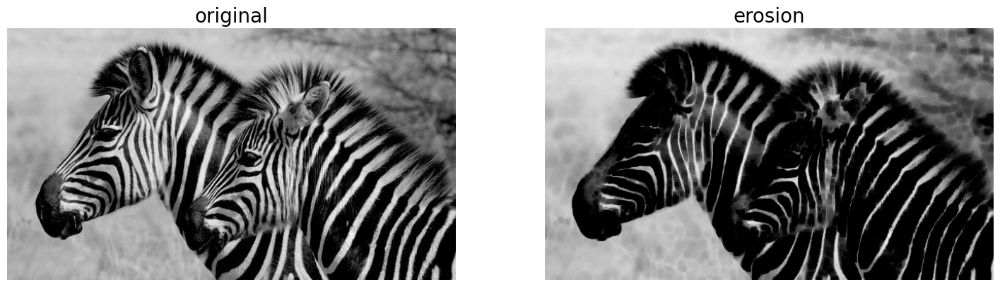

In [43]:
#Gri tonlama işlemleri

# Gri seviye erozyon
from skimage.morphology import dilation, erosion, closing, opening, square
im = imread('ImageProcessingLecture/Ims/zebras.jpg')
im = rgb2gray(im)
struct_elem = square(5)
eroded = erosion(im, struct_elem)
plot_images_horizontally(im, eroded, 'erosion')

#siyah çizgiler erozyonla genişlemiştir:

<Figure size 640x480 with 0 Axes>

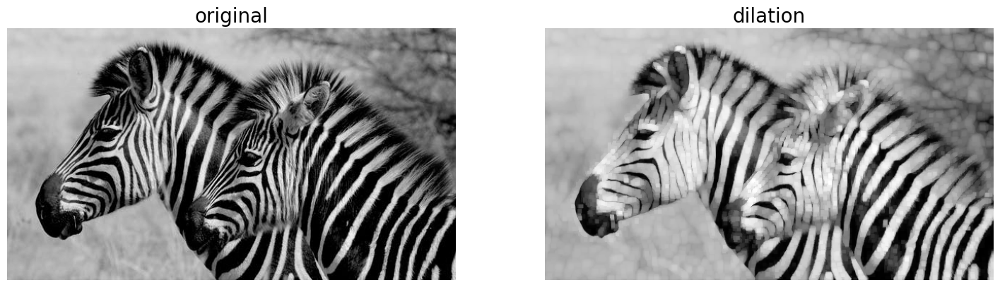

In [44]:
# Gri seviye dilation
dilated = dilation(im, struct_elem)
plot_images_horizontally(im, dilated, 'dilation')

#siyah çizgiler dilation ile daralmıştır:

<Figure size 640x480 with 0 Axes>

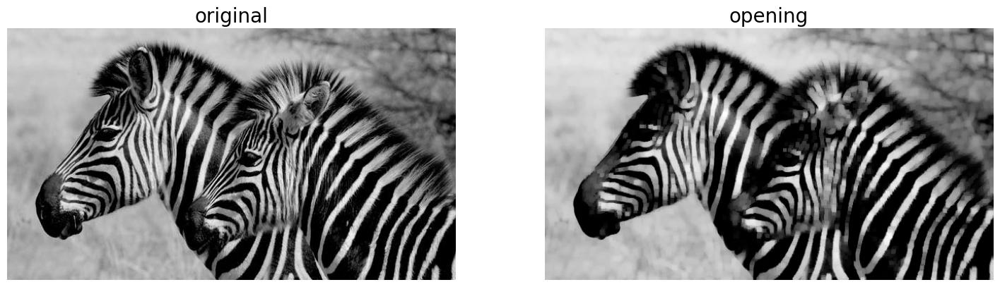

In [45]:
# Gri seviye opening

opened = opening(im, struct_elem)
plot_images_horizontally(im, opened, 'opening')

#Bazı ince beyaz şeritler çıkarılmış olsa da siyah şeritlerin genişliği açılışla birlikte değişmemiştir:

<Figure size 640x480 with 0 Axes>

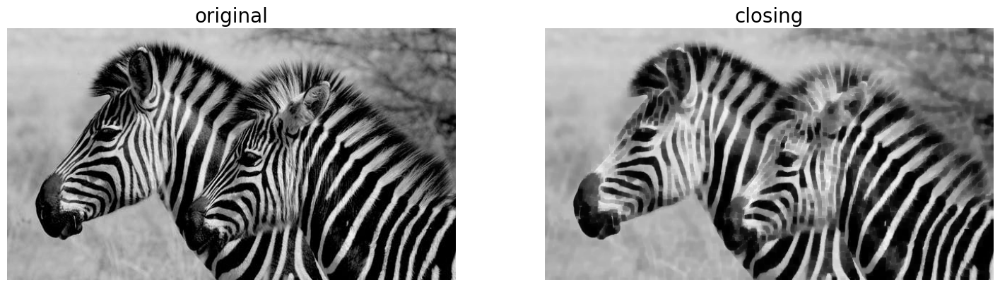

In [46]:
# Gri seviye closing
closed = closing(im, struct_elem)
plot_images_horizontally(im, closed, 'closing')

#Bazı ince siyah şeritler çıkarılmış olsa da beyaz şeritlerin genişliği closing birlikte değişmemiştir:

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_19912\1910153932.py:22: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  enhanced_image = enhance_contrast(noisy_image, disk(5))


(<Axes: title={'center': 'Adaptive Histogram equalization'}>, None)

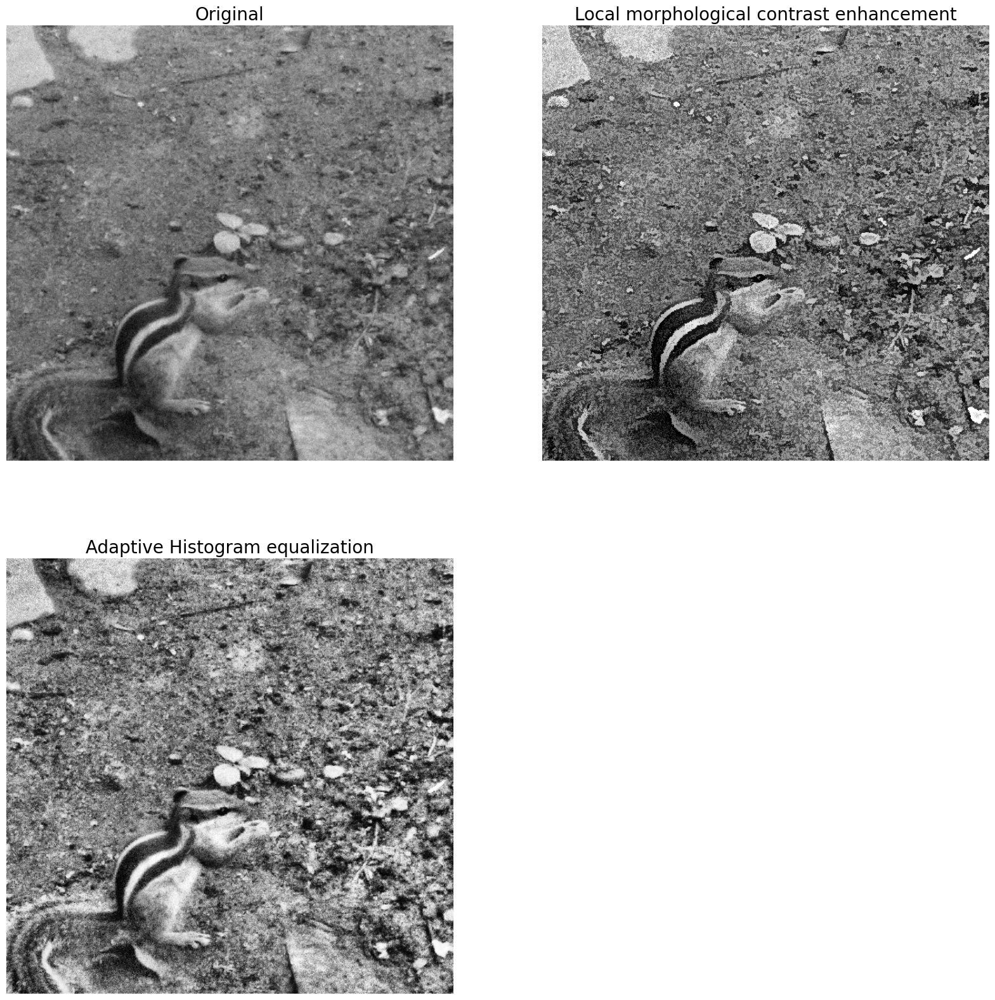

In [49]:
# scikit-image filter.rank module

#scikit-image'ın filter.rank modülü morfolojik filtreleri uygulamak için fonksiyonlar sağlar; 
#örneğin, morfolojik medyan filtresi ve morfolojik kontrast geliştirme filtresi.

#Morfolojik kontrast geliştirme

#Morfolojik kontrast geliştirme filtresi, yalnızca bir yapılandırma öğesi tarafından tanımlanan bir komşuluktaki pikselleri 
#dikkate alarak her piksel üzerinde çalışır. Merkezi pikseli, orijinal pikselin hangisine en yakın olduğuna bağlı olarak, 
#komşuluktaki yerel minimum veya yerel maksimum pikselle değiştirir.

from skimage.filters.rank import enhance_contrast
from skimage import exposure
def plot_gray_image(ax, image, title):
    ax.imshow(image, cmap=pylab.cm.gray),
    ax.set_title(title), ax.axis('off')
    ax.set_adjustable('box-forced')
    
image = rgb2gray(imread('ImageProcessingLecture/Ims/squirrel.jpg'))
sigma = 0.05
noisy_image = np.clip(image + sigma * np.random.standard_normal(image.shape), 0, 1)
enhanced_image = enhance_contrast(noisy_image, disk(5))
equalized_image = exposure.equalize_adapthist(noisy_image)


pylab.figure(figsize=(20,20))
pylab.subplot(221), plot_image(noisy_image, 'Original')
pylab.subplot(222), plot_image(enhanced_image, 'Local morphological contrast enhancement')
pylab.subplot(223), plot_image(equalized_image, 'Adaptive Histogram equalization')

#orjinal kod örneğinde artık desteklenmeyen türlerden dolayı hata alınabilir. 


(<Axes: title={'center': 'Median $r=20$'}>, None)

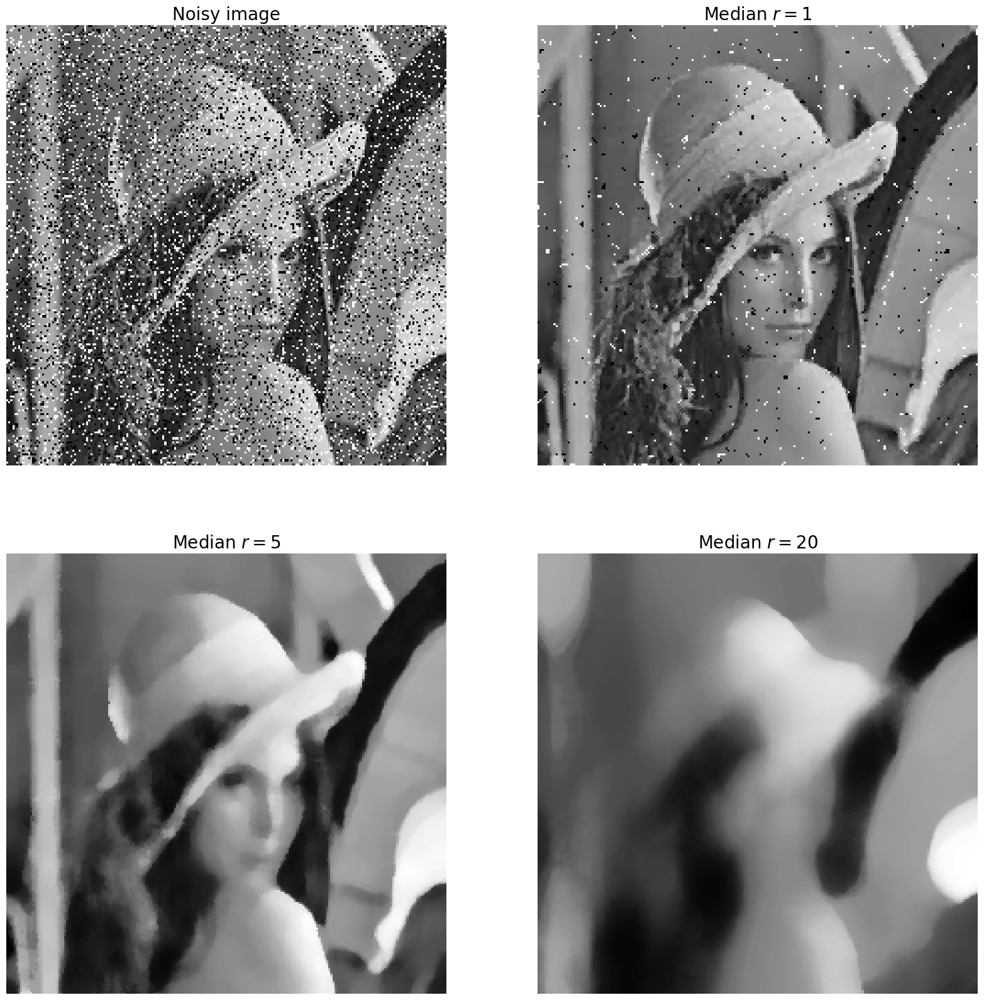

In [52]:
# median filter ile gürültü kaldırma

#Giriş gri tonlamalı Lena görüntüsüne, piksellerin %10'unu rastgele 255'e (tuz) ve diğer %10'unu 0'a (biber) 
#ayarlayarak bir miktar gürültü eklenmiştir. Kullanılan yapılandırma elemanları, 
#medyan filtre ile gürültüyü gidermek için farklı boyutlarda disklerdir:

from skimage.filters.rank import median
from skimage.morphology import disk
noisy_image = (rgb2gray(imread('ImageProcessingLecture/Ims/lena.jpg'))*255).astype(np.uint8)
noise = np.random.random(noisy_image.shape)
noisy_image[noise > 0.9] = 255
noisy_image[noise < 0.1] = 0


pylab.figure(figsize=(20,20))
pylab.subplot(221), plot_image(noisy_image, 'Noisy image')
pylab.subplot(222), plot_image(median(noisy_image, disk(1)), 'Median $r=1$')
pylab.subplot(223), plot_image(median(noisy_image, disk(5)), 'Median $r=5$')
pylab.subplot(224), plot_image(median(noisy_image, disk(20)), 'Median $r=20$')


C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_19912\2458839206.py:24: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  fig.colorbar(axes2.imshow(entropy(image, disk(5)), cmap=pylab.cm.inferno), ax=axes2)


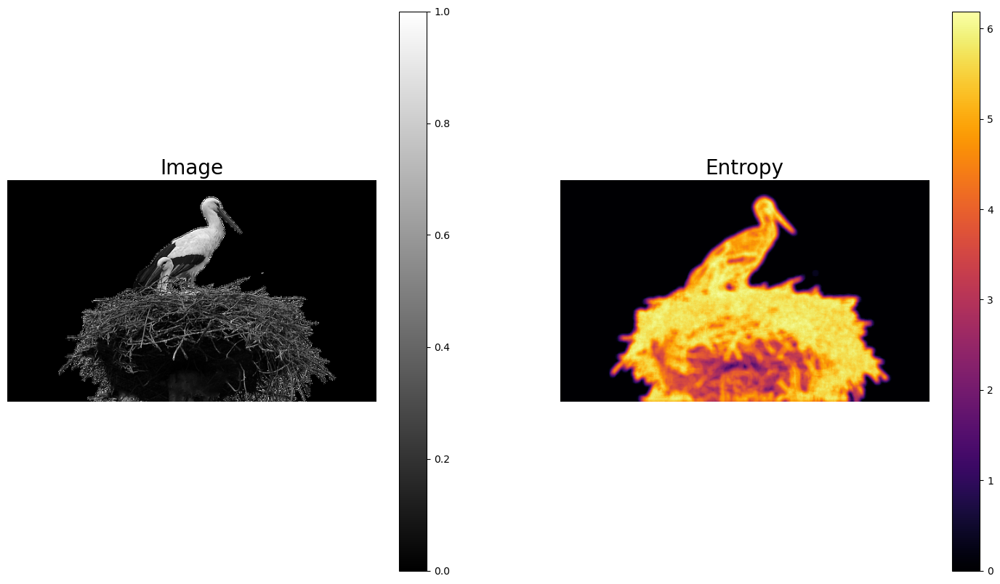

In [66]:
# Local Entropi hesaplama

#Entropi, bir görüntüdeki belirsizliğin veya rastgeleliğin bir ölçüsüdür.

#global entropi hesaplanabileceği gibi benzer bir şekilde,
#yerel görüntü karmaşıklığını tanımlamak için yerel entropiyi de tanımlayabiliriz ve yerel histogramlardan hesaplanabilir.

#skimage.rank.entropy() işlevi, belirli bir yapılandırma öğesi üzerindeki bir görüntünün yerel entropisini 
#(yerel gri düzey dağılımını kodlamak için gereken minimum bit sayısı) hesaplar. 
#Aşağıdaki örnekte bu filtrenin gri tonlamalı bir görüntüye nasıl uygulanacağı gösterilmektedir. 
#İşlev, 8 bit görüntüler için 10x entropi döndürür:



#Örnekte daha yüksek entropiye sahip bölgeler (başka bir deyişle, kuş yuvası gibi daha yüksek bilgi içeriğine sahip bölgeler) 
#daha parlak renkler:

from skimage.morphology import disk
from skimage.filters.rank import entropy
image = rgb2gray(imread('ImageProcessingLecture/Ims/birds.png')[:,:,:3])
fig, (axes1, axes2) = pylab.subplots(1, 2, figsize=(18, 10), sharex=True, sharey=True)
fig.colorbar(axes1.imshow(image, cmap=pylab.cm.gray), ax=axes1)
axes1.axis('off'), axes1.set_title('Image', size=20), axes1.set_adjustable('box')
fig.colorbar(axes2.imshow(entropy(image, disk(5)), cmap=pylab.cm.inferno), ax=axes2)
axes2.axis('off'), axes2.set_title('Entropy', size=20), axes2.set_adjustable('box')
pylab.show()

C:\Users\MKOTAN\AppData\Local\Temp\ipykernel_19912\3132887810.py:8: DeprecationWarning: Please use `binary_fill_holes` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import binary_fill_holes


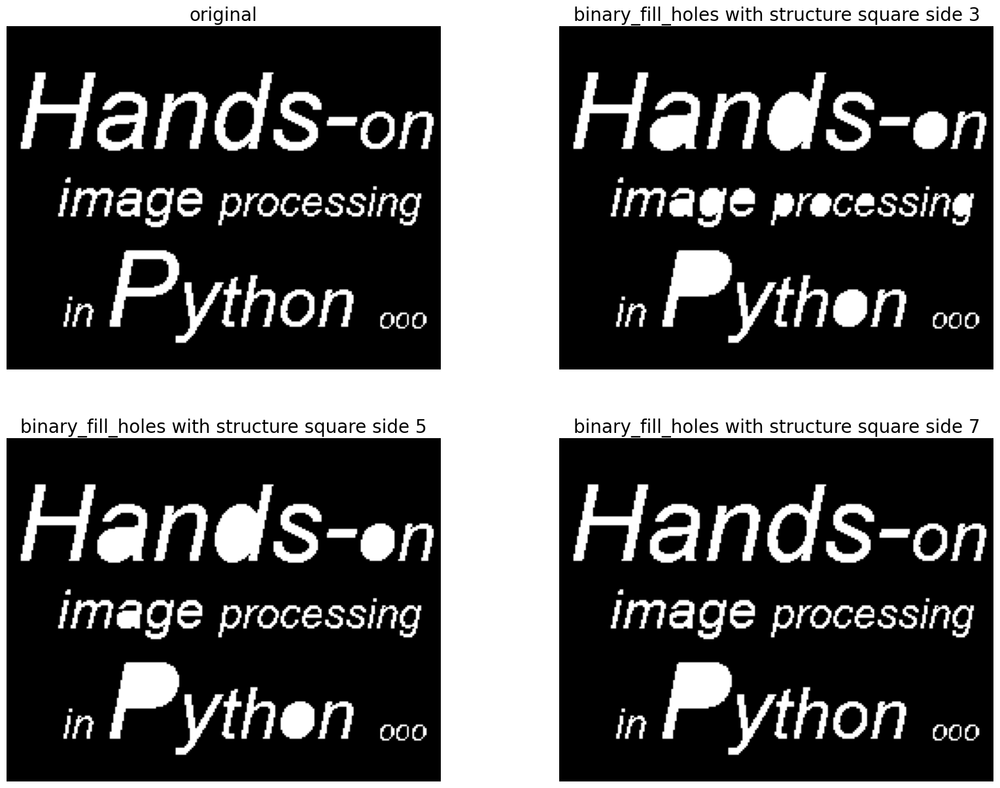

In [69]:
#SciPy ndimage.morphology module

#SciPy ndimage.morphology modülü ayrıca ikili ve gri tonlamalı görüntüler üzerinde morfolojik işlemler için 
#daha önce tartışılan işlevleri sağlar

# İkili nesnelerde boşlukları doldurma

from scipy.ndimage.morphology import binary_fill_holes
im = rgb2gray(imread('ImageProcessingLecture/Ims/text1.png')[:,:,:3])
im[im <= 0.5] = 0
im[im > 0.5] = 1
pylab.figure(figsize=(20,15))
pylab.subplot(221), pylab.imshow(im), pylab.title('original', size=20),pylab.axis('off')
i = 2
for n in [3,5,7]:
    pylab.subplot(2, 2, i)
    im1 = binary_fill_holes(im, structure=np.ones((n,n)))
    pylab.imshow(im1), pylab.title('binary_fill_holes with structure square side ' + str(n), size=20)
    pylab.axis('off')
    i += 1
pylab.show()

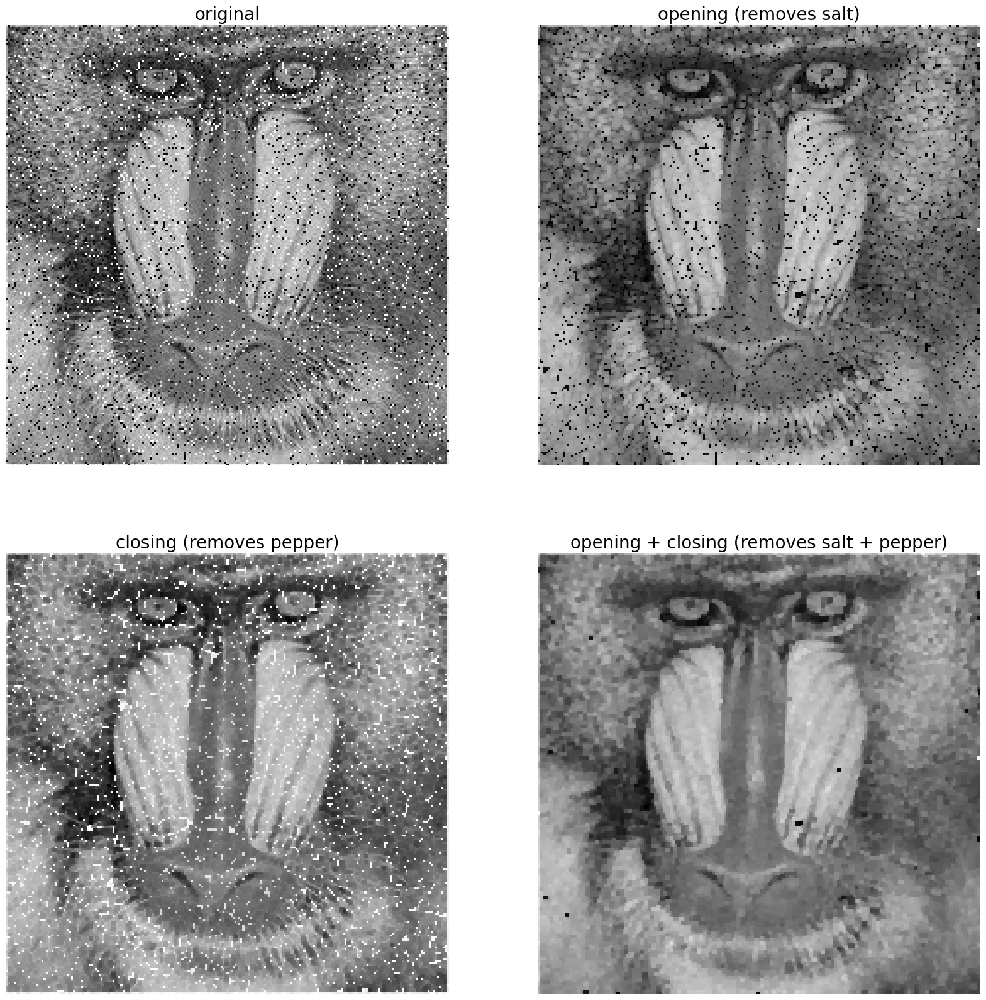

In [70]:
# Gürültüyü elemek için opening ve closing kullanma

from scipy import ndimage
im = rgb2gray(imread('ImageProcessingLecture/Ims/mandrill_spnoise_0.1.jpg'))
im_o = ndimage.grey_opening(im, size=(2,2))
im_c = ndimage.grey_closing(im, size=(2,2))
im_oc = ndimage.grey_closing(ndimage.grey_opening(im, size=(2,2)), size=(2,2))
pylab.figure(figsize=(20,20))
pylab.subplot(221), pylab.imshow(im), pylab.title('original', size=20), pylab.axis('off')
pylab.subplot(222), pylab.imshow(im_o), pylab.title('opening (removes salt)', size=20), pylab.axis('off')
pylab.subplot(223), pylab.imshow(im_c), pylab.title('closing (removes pepper)', size=20),pylab.axis('off')
pylab.subplot(224), pylab.imshow(im_oc), pylab.title('opening + closing (removes salt + pepper)', size=20)
pylab.axis('off')
pylab.show()

<Figure size 640x480 with 0 Axes>

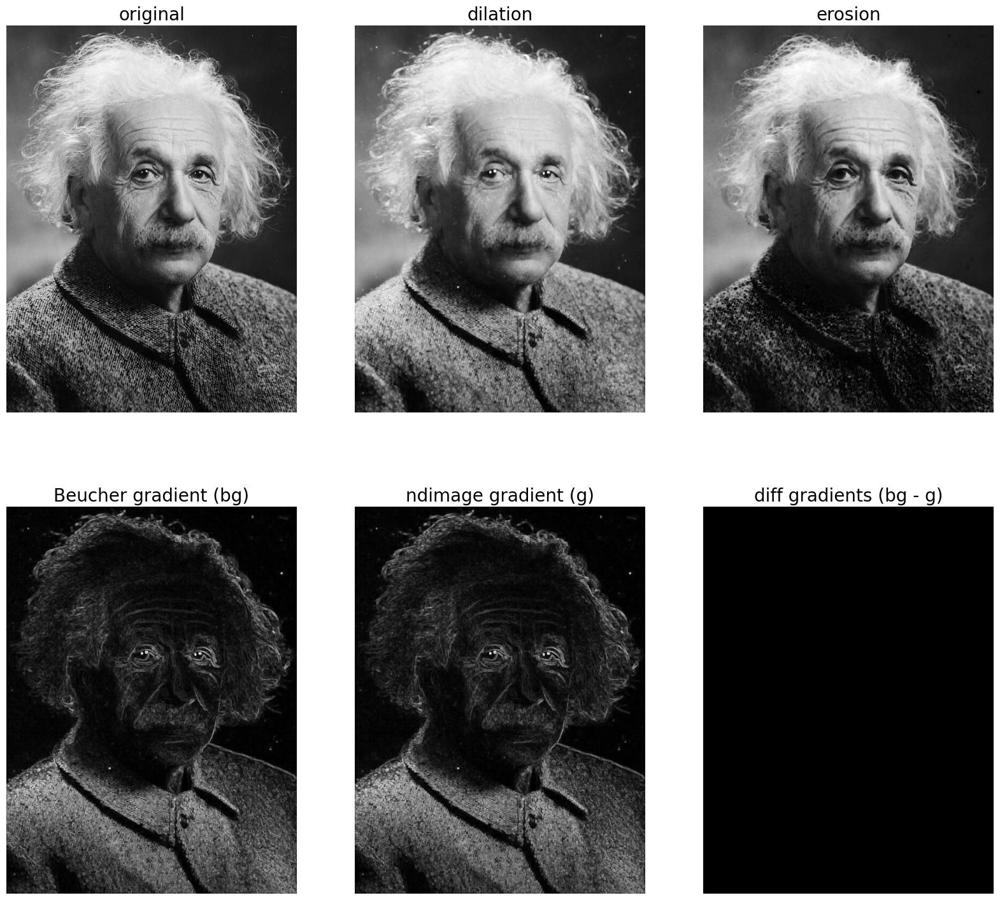

In [74]:
#morphological Beucher gradient hesaplama

#Morfolojik Beucher gradyanı, bir giriş gri tonlamalı görüntünün dilated versiyonunun ve erosion versiyonunun 
#fark görüntüsü olarak hesaplanabilir

#Morfolojik gradyan, genişleme ile erozyon arasındaki farktır.
#-- Keskin gri seviye geçişlerini vurgular.
#-- Morfolojik gradyanlar, bir SE tarafından belirlenen bir komşuluktaki piksel yoğunluğu değişimlerini artıran operatörlerdir.
#-- 

from scipy import ndimage
im = imread('ImageProcessingLecture/Ims/einstein.jpg')
im_d = ndimage.grey_dilation(im, size=(3,3))
im_e = ndimage.grey_erosion(im, size=(3,3))
im_bg = im_d - im_e
im_g = ndimage.morphological_gradient(im, size=(3,3))
pylab.gray()
pylab.figure(figsize=(20,18))
pylab.subplot(231), pylab.imshow(im), pylab.title('original', size=20),
pylab.axis('off')
pylab.subplot(232), pylab.imshow(im_d), pylab.title('dilation', size=20),
pylab.axis('off')
pylab.subplot(233), pylab.imshow(im_e), pylab.title('erosion', size=20),
pylab.axis('off')
pylab.subplot(234), pylab.imshow(im_bg), pylab.title('Beucher gradient (bg)', size=20), pylab.axis('off')
pylab.subplot(235), pylab.imshow(im_g), pylab.title('ndimage gradient (g)', size=20), pylab.axis('off')
pylab.subplot(236), pylab.title('diff gradients (bg - g)', size=20), pylab.imshow(im_bg - im_g) 
pylab.axis('off')
pylab.show()

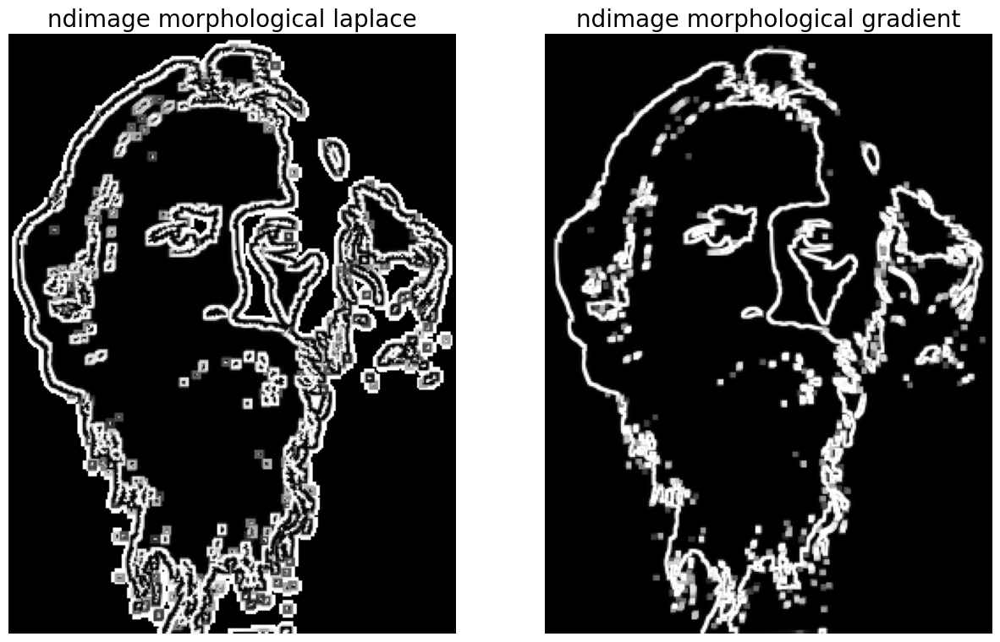

In [75]:
# Morfolojik Laplace
#iç ve dış gradyan arasındaki aritmetik fark olarak tanımlanır
#http://www.cyto.purdue.edu/cdroms/micro2/content/education/wirth08.pdf


im = imread('ImageProcessingLecture/Ims/tagore.png')[...,3]
im_g = ndimage.morphological_gradient(im, size=(3,3))
im_l = ndimage.morphological_laplace(im, size=(5,5))
pylab.figure(figsize=(15,10))
pylab.subplot(121), pylab.title('ndimage morphological laplace', size=20), pylab.imshow(im_l)
pylab.axis('off')
pylab.subplot(122), pylab.title('ndimage morphological gradient', size=20),
pylab.imshow(im_g)
pylab.axis('off')
pylab.show()